# Check dataflow

In [2]:
# !pip install --upgrade albumentations

In [3]:
import sys
sys.path.insert(0, "../code")

In [4]:
data_path = "../input/train_tiles/"
csv_path = "../input/train_tiles/tile_stats.csv"

In [5]:
from dataflow.datasets import get_trainval_datasets

In [6]:
train_folds = [0, 1, 2]
val_folds = [3, ]

train_ds, val_ds = get_trainval_datasets(data_path, csv_path, train_folds=train_folds, val_folds=val_folds)

In [7]:
len(train_ds), len(val_ds)

(6198, 1921)

In [8]:
from dataflow.dataloaders import get_train_val_loaders, get_train_sampler

In [9]:
from dataflow.vis import make_grid

import numpy as np
import matplotlib.pylab as plt
%matplotlib inline

In [10]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_img_size = 496

mean = (0.0, 0.0, 0.0)
std = (3.0, 3.0, 3.0)
max_value = 1.0


train_transforms = A.Compose([
    A.RandomResizedCrop(train_img_size, train_img_size, scale=(0.7, 1.0), ratio=(0.9, 1.1)),
    A.OneOf([
        A.RandomRotate90(),
        A.Flip(),        
    ]),
    A.Normalize(mean=mean, std=std, max_pixel_value=max_value),
    ToTensorV2()
])


val_transforms = A.Compose([
    A.Normalize(mean=mean, std=std, max_pixel_value=max_value),
    ToTensorV2()
])

In [11]:
train_sampler = get_train_sampler(train_ds, weight_per_class=[0.5, 0.5])

100%|██████████| 6198/6198 [00:27<00:00, 222.22it/s]


In [12]:
!ls /tmp/unosat

'train_sampler_weights_6198__[0.5_0.5].pth'


In [15]:
train_loader, val_loader, train_eval_loader = get_train_val_loaders(
    train_ds,
    val_ds,
    train_transforms=train_transforms,
    val_transforms=val_transforms,
    batch_size=4,
    num_workers=10,
    val_batch_size=4,
    train_sampler=train_sampler
)

In [16]:
train_loader_iter = iter(train_loader)
val_loader_iter = iter(val_loader)
train_eval_loader_iter = iter(train_eval_loader)

Train loader

In [17]:
batch = next(train_loader_iter)

In [18]:
batch['image'].max(), batch['image'].min()

(tensor(181.8983), tensor(-0.8478))

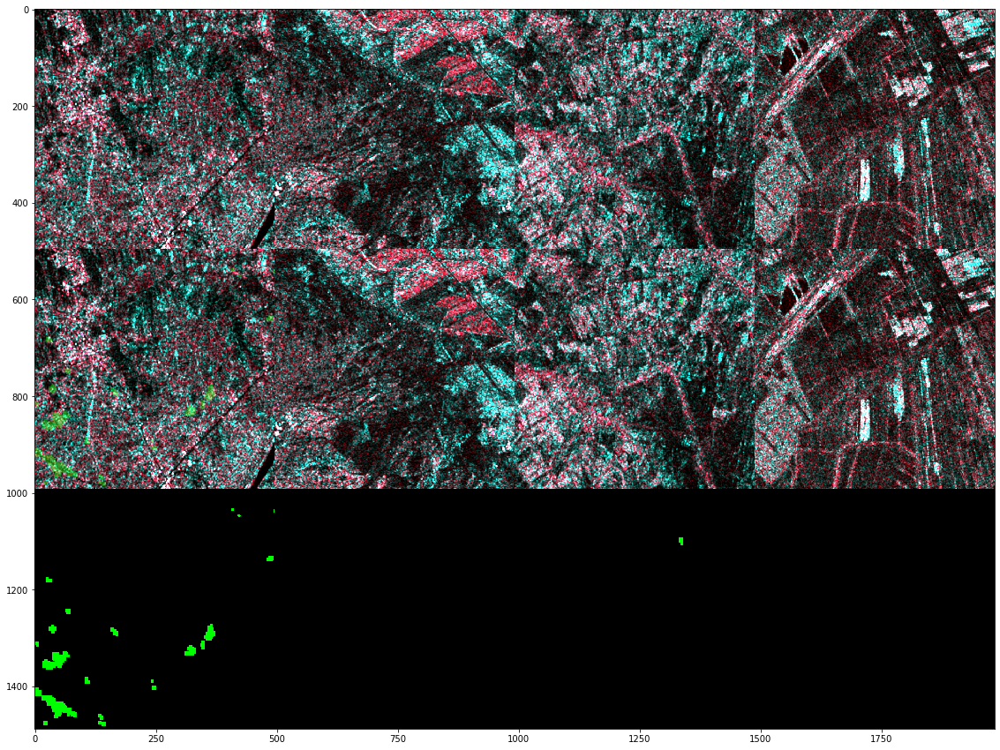

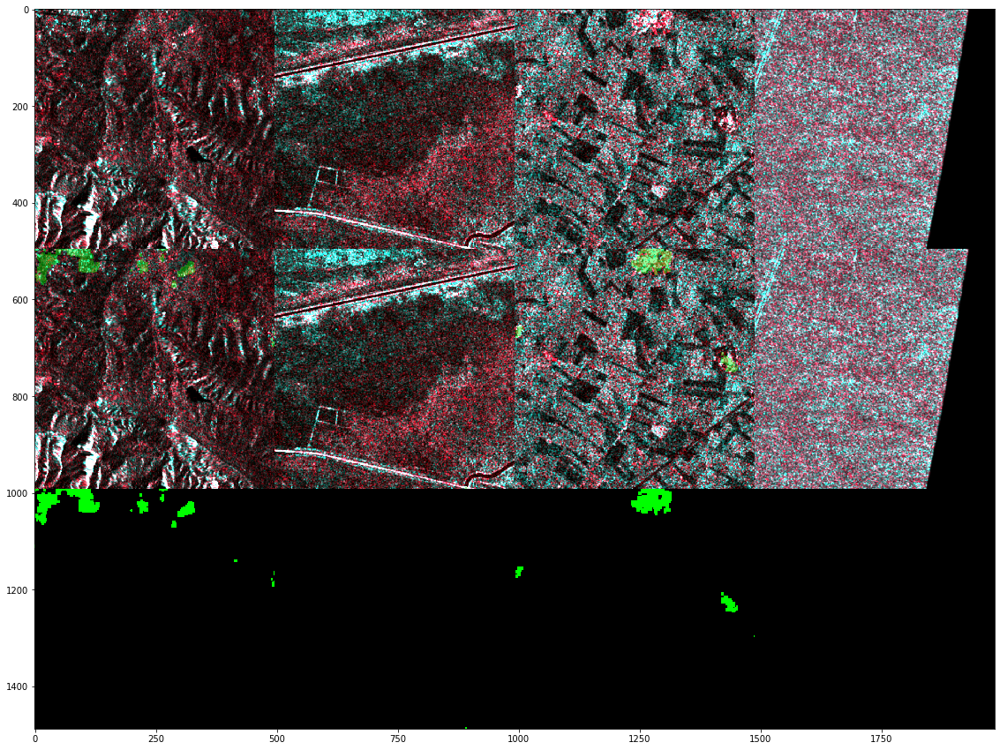

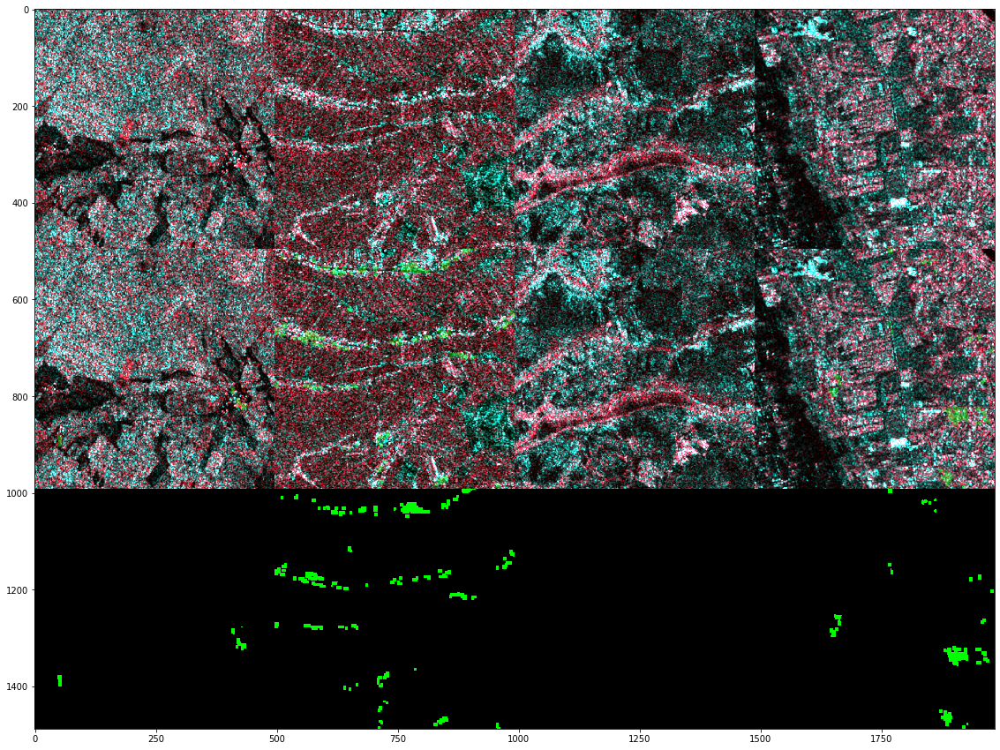

In [20]:
from functools import partial


for _ in range(3):
    batch = next(train_loader_iter)

    batch_x = batch['image']
    batch_y = batch['mask']
    
    plt.figure(figsize=(30, 15))
    grid_pred_gt = make_grid(batch_x, batch_y, 
                             img_denormalize_fn=lambda x: x)
    plt.imshow(grid_pred_gt)

Val loader

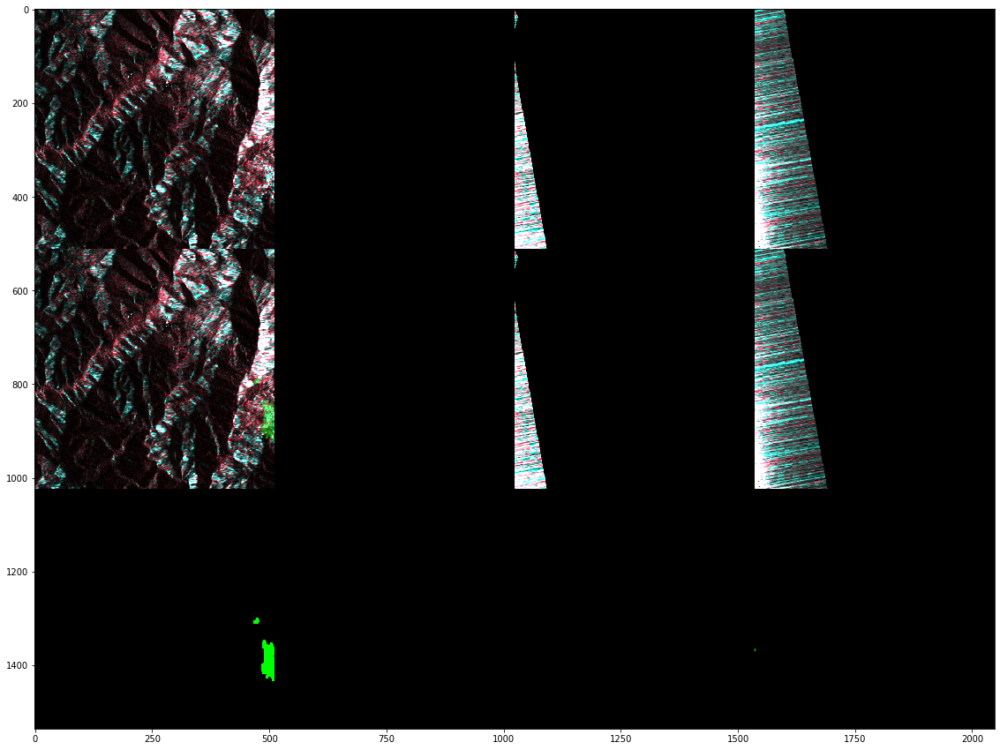

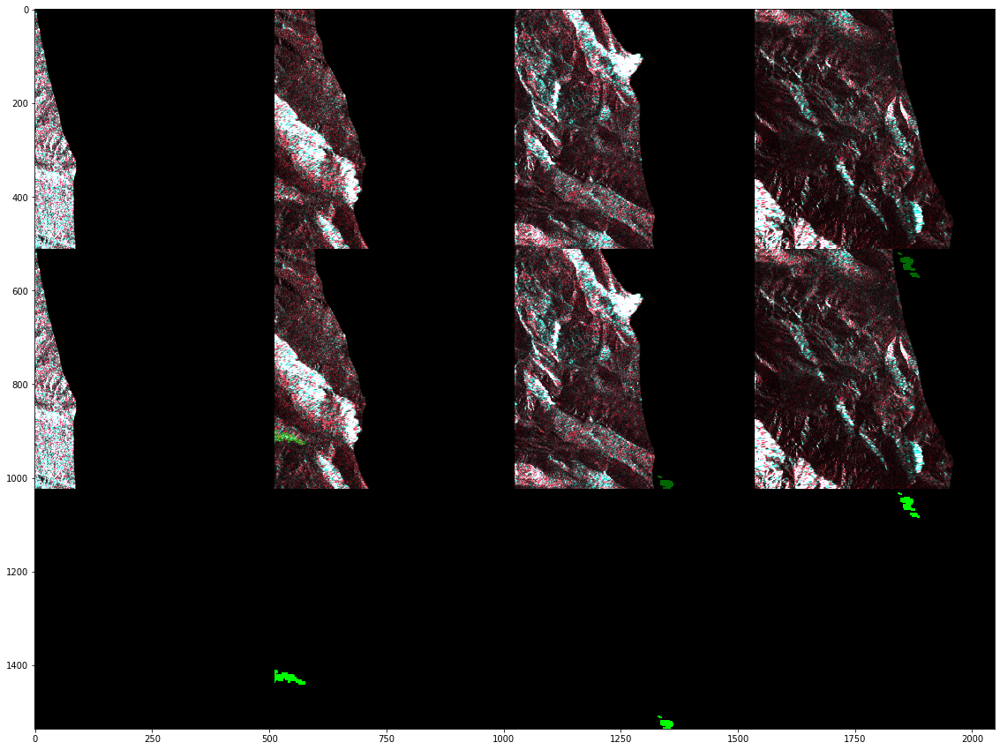

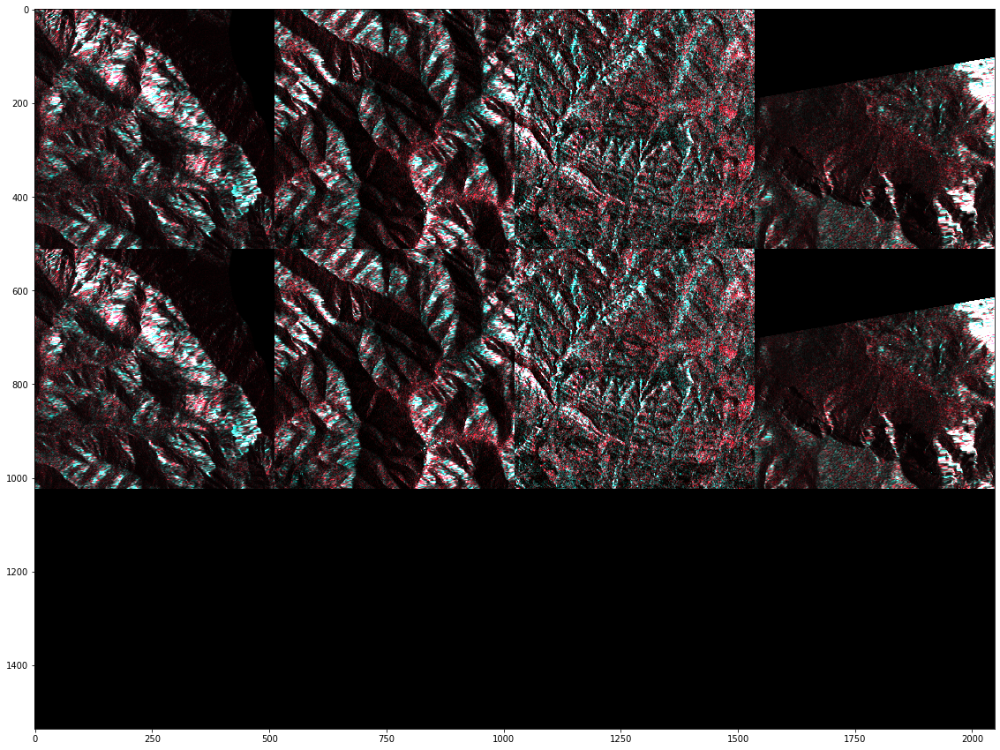

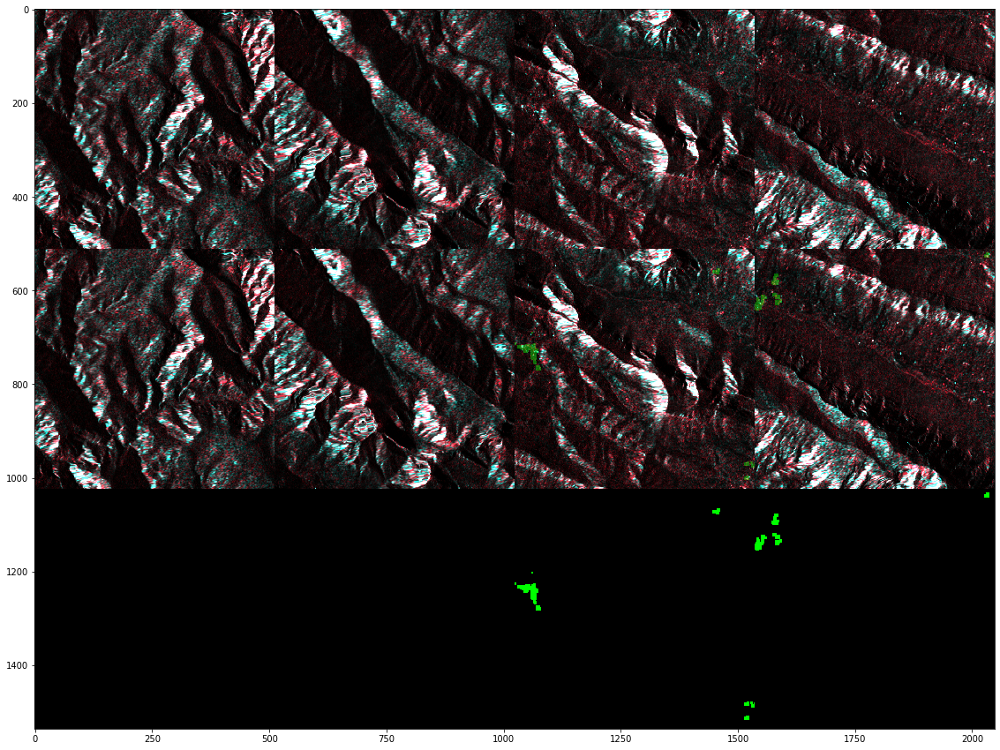

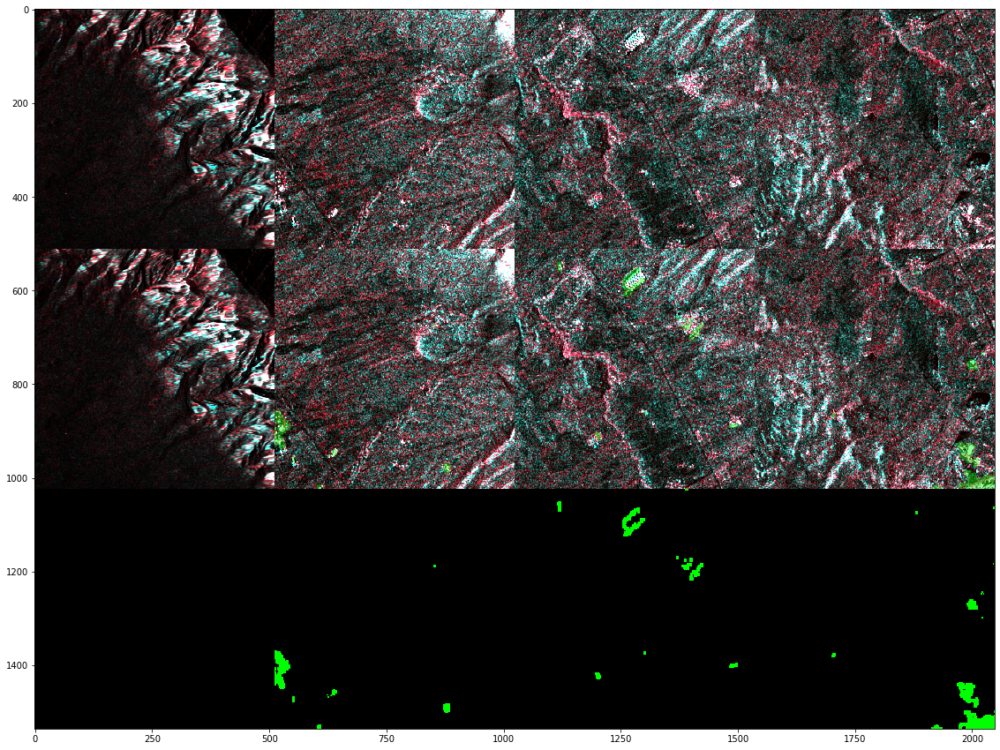

In [22]:
from functools import partial


for _ in range(5):
    batch = next(val_loader_iter)

    batch_x = batch['image']
    batch_y = batch['mask']
    
    plt.figure(figsize=(30, 15))
    grid_pred_gt = make_grid(batch_x, batch_y, 
                             img_denormalize_fn=lambda x: x)
    plt.imshow(grid_pred_gt)

In [24]:
from ignite.metrics import ConfusionMatrix
from ignite.metrics.confusion_matrix import cmPrecision, cmRecall

In [25]:
cm = ConfusionMatrix(2)

In [26]:
pr = cmPrecision(cm, average=False)

In [27]:
type(pr)

ignite.metrics.metrics_lambda.MetricsLambda